# 1. Introduction

The goal of this project is the semantic segmentation of drone-captured photographs illustrating urban scenes. Semantic segmentation divides an image into multiple predefined categories, such that every pixel is classified into one of eight classes of urban structures:

- **Building**
- **Road**
- **Static car**
- **Tree**
- **Low vegetation**
- **Person**
- **Moving car**
- **Background noise**

To evaluate segmentation performance, the Jaccard index, also known as the intersection-over-union (IoU) measure, is used. The calculation formula for this metric is as follows:

$$
IoU = \frac{Intersection + \epsilon}{Union + \epsilon}\
$$

$$
IoU Loss = 1 - IoU
$$

where TP represents the *true positives*, FP represents the *false positives*, and FN represents the *false negatives*.

The motivation for developing a semantic segmentation system for urban images captured by drones lies in the limited number of studies addressing both overhead and lateral perspectives. While there is an abundance of satellite imagery covering larger areas, these images lack high quality due to being captured from great distances. In contrast, images from devices like drones offer better detail, facilitating the collection of more precise information.

The implementation of a semantic segmentation system for this type of imagery can support urban planning, environmental monitoring, and natural disaster analysis.

A historical overview of the approaches used to address the segmentation task includes models such as CNN, U-Net, with the latest being the transformer architecture, which utilizes the *self-attention* mechanism. Common issues with these architectures include challenges with dense urban clusters or very small individual objects, as they are hard for the model to identify. Additionally, categories that can be represented in various ways, such as different types of vegetation, pose another challenge.

Regarding existing work, some of the segmentation models that achieve the highest IoU scores include:

- **U-Net Ensemble**
- **U-Net**
- **SFA-Net**
- **LSKNet-S**
- **UNet-Former**

**U-Net Ensemble** is presented in the paper *U-Net Ensemble for Enhanced Semantic Segmentation in Remote Sensing Imagery* and utilizes an ensemble of three models: *Multi-Axis Vision Transformer*, *ConvFormer*, and *EfficientNet*. One of the datasets used for training these models is UAVid. The final result is obtained by calculating a geometric mean of the results from these three models, thus maximizing segmentation accuracy.

# 2. Dataset

Modul în care se lucrează cu sistemul de fișiere pentru a manipula cele trei grupuri de date este ilustrat mai jos:

The first step in implementing the semantic segmentation project involves collecting the dataset used for training the model. We used the UAVid dataset, which consists of high-quality video sequences representing urban scenes. Each image has a corresponding labeled counterpart.

The images are divided into three categories:

- Train - 200 images
- Validation - 70 images
- Test - 150 images

The process of working with the file system to manipulate these three data groups is illustrated below:

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

train_dir = 'data/train'
validation_dir = 'data/valid'
test_dir = 'data/test'
train_indices = np.append(np.arange(1, 16), np.arange(31, 36))
validation_indices = np.array([16, 17, 18, 19, 20, 36, 37])
test_indices = np.append(np.arange(21, 31), np.arange(38, 43))
nb_images = 10

def display_image_and_label(dir, seq_name, img_name, test=False):
    img_path = os.path.join(dir, seq_name, 'Images', img_name)
    img = Image.open(img_path)

    if not test:
        label_path = os.path.join(dir, seq_name, 'Labels', img_name)
        label = Image.open(label_path)

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(img)
        axes[0].set_title(f"Image: {img_name}")
        axes[0].axis('off')

        axes[1].imshow(label)
        axes[1].set_title(f"Label: {img_name}")
        axes[1].axis('off')
    else:
        plt.imshow(img)
        plt.title(f"Image: {img_name}")
        plt.axis('off')

    plt.show()

Display train images and labels

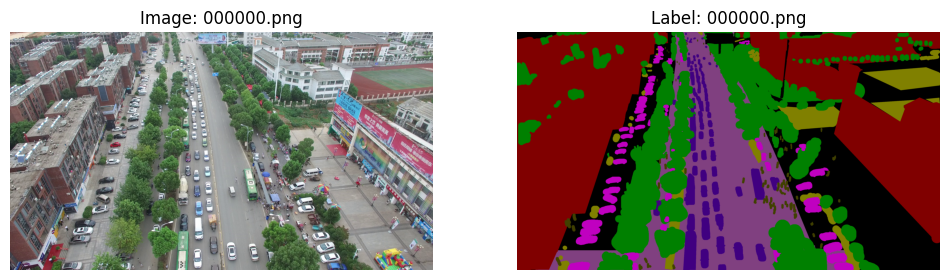

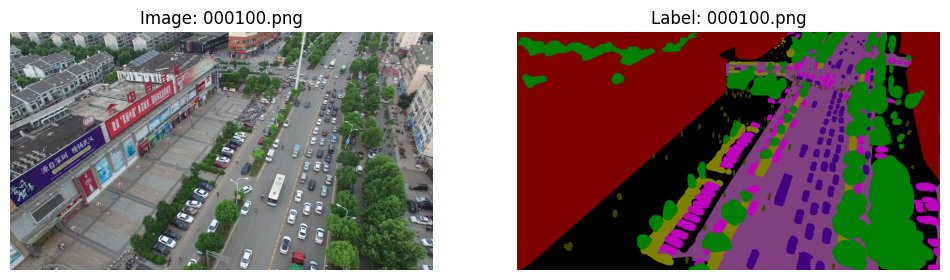

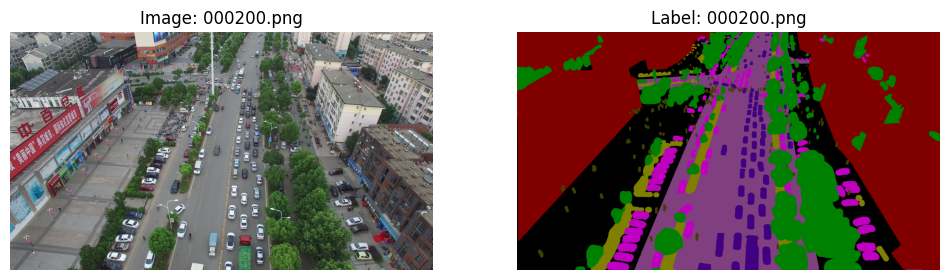

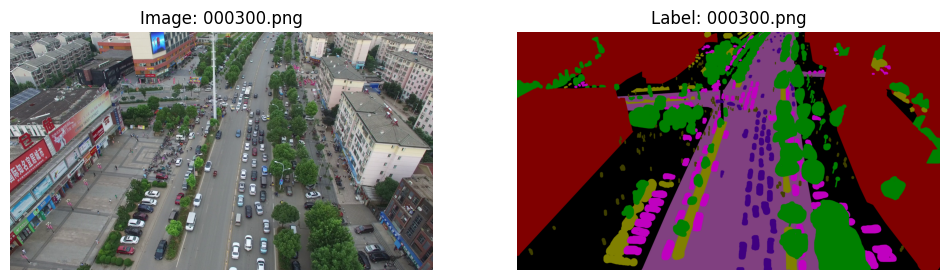

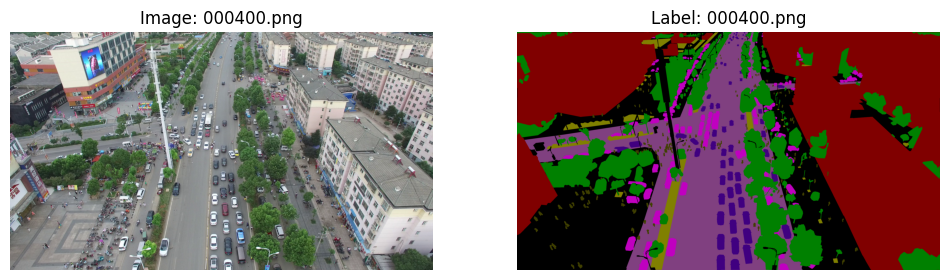

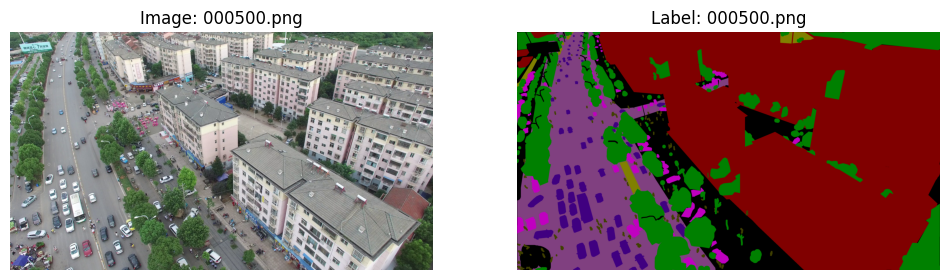

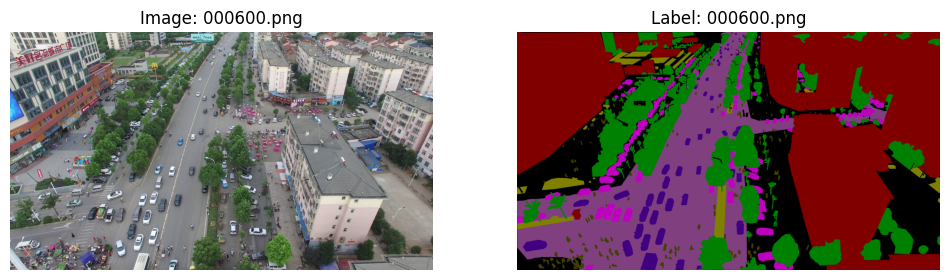

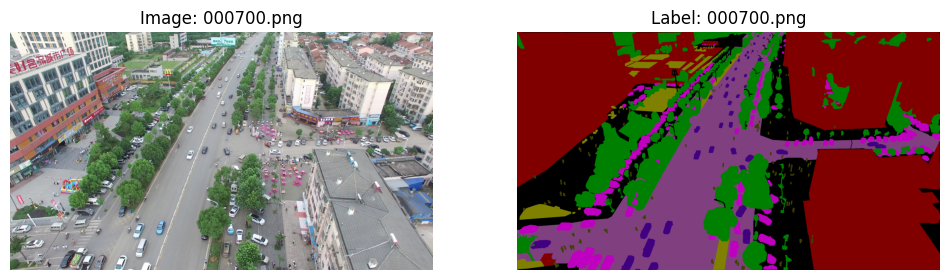

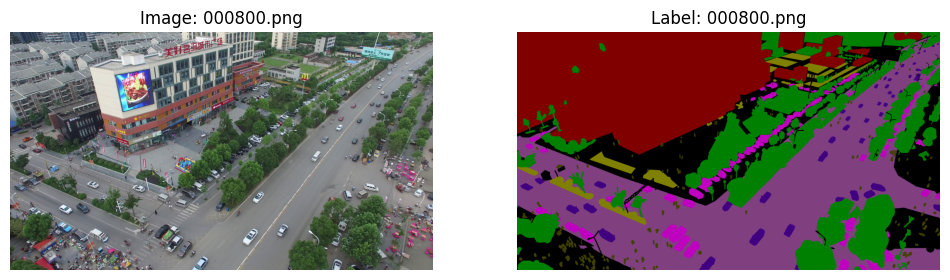

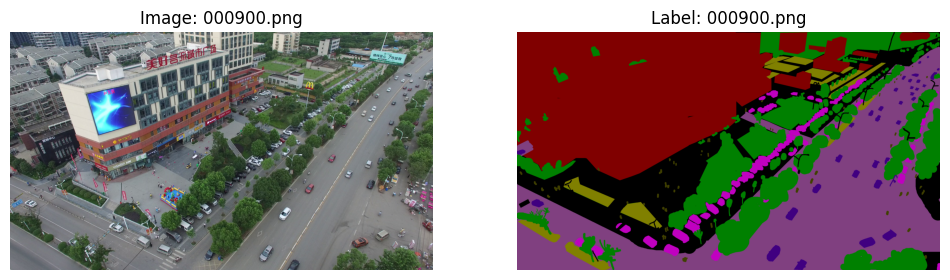

In [2]:
for i in train_indices[:1]:
    for j in range(10):
        display_image_and_label(train_dir, f'seq{i}', f'000{j}00.png')

Display validation images and labels:

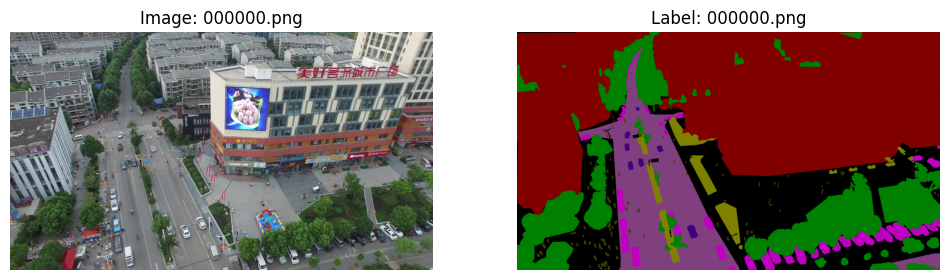

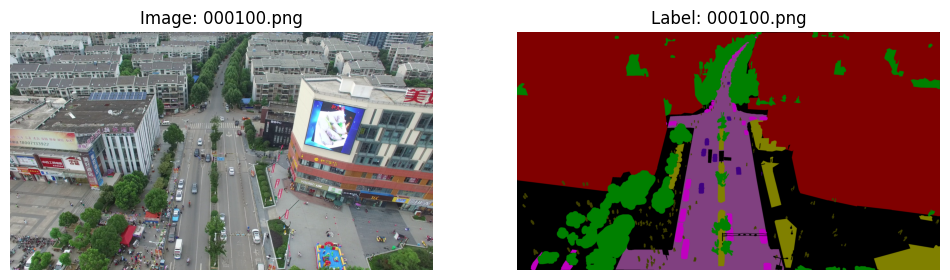

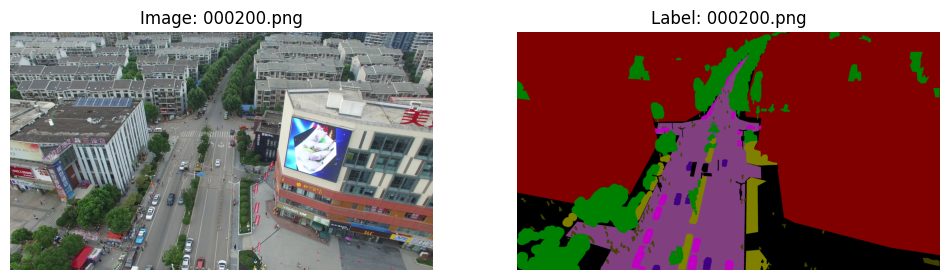

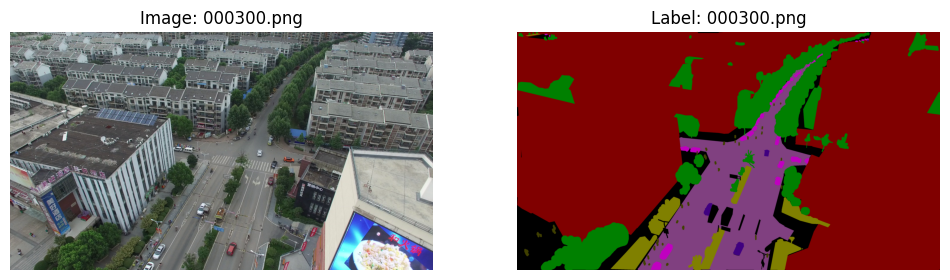

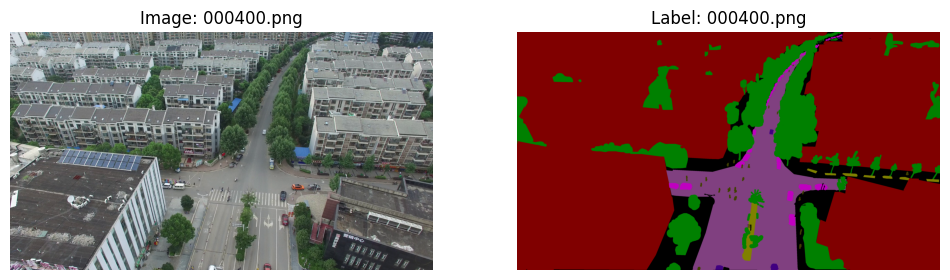

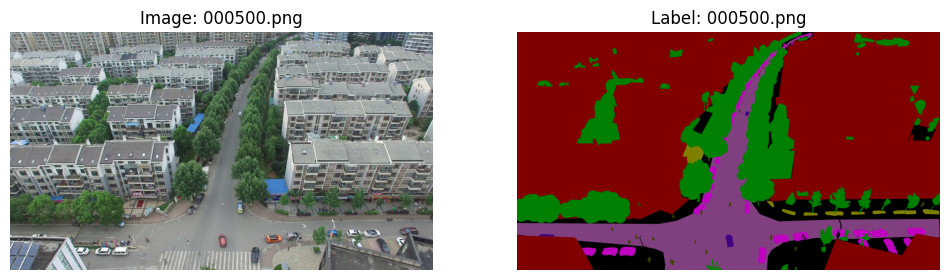

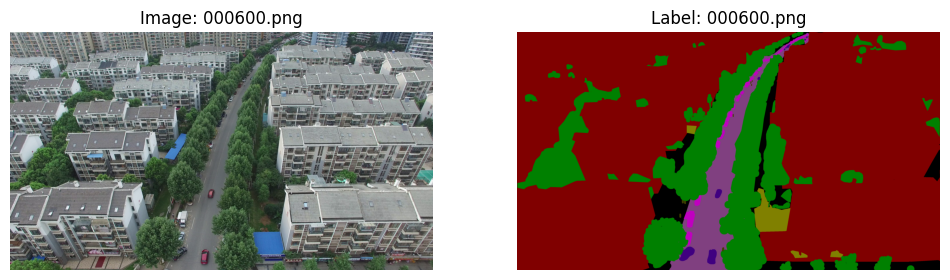

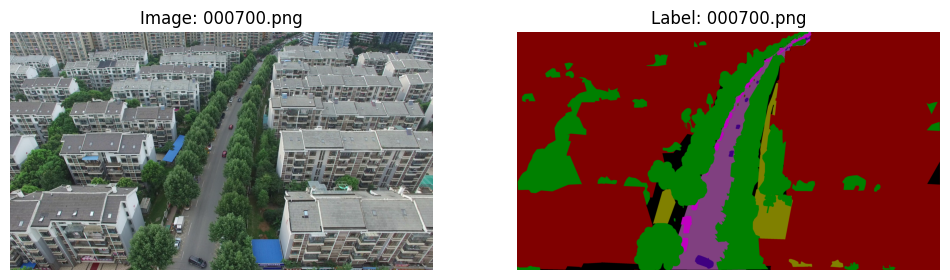

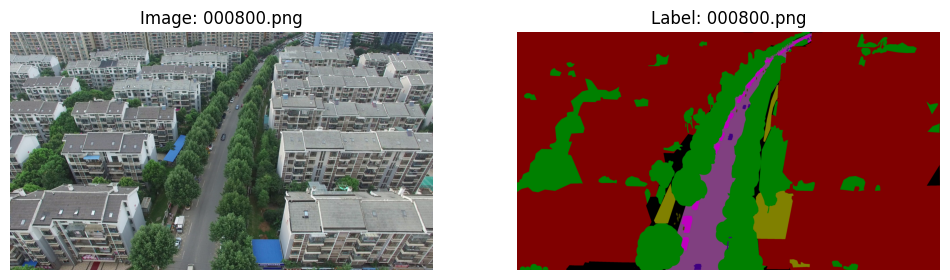

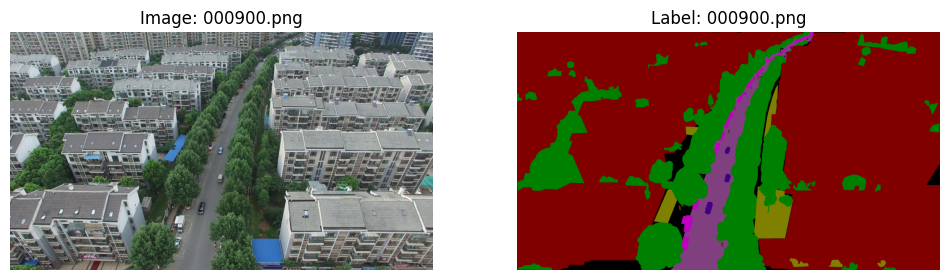

In [3]:
for i in validation_indices[:1]:
    for j in range(10):
        display_image_and_label(validation_dir, f'seq{i}', f'000{j}00.png')

Display test images:

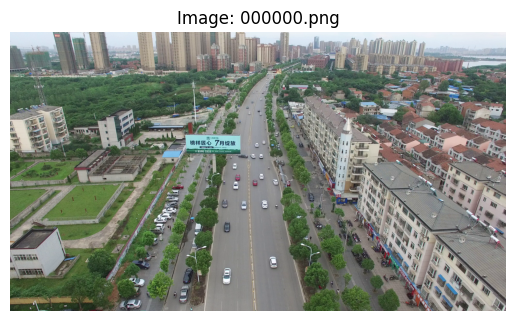

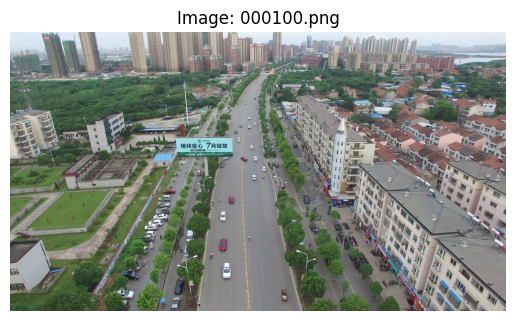

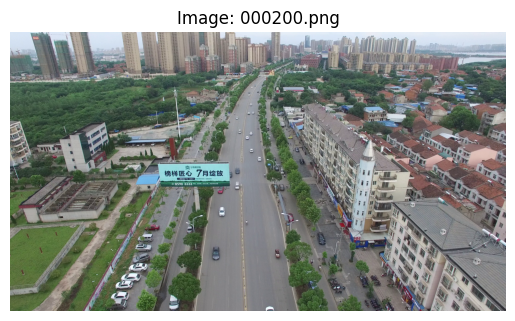

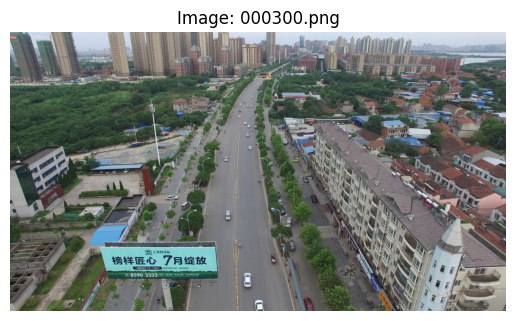

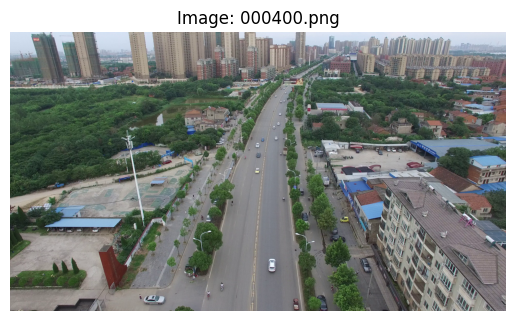

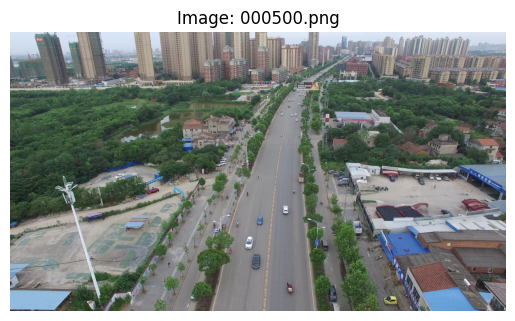

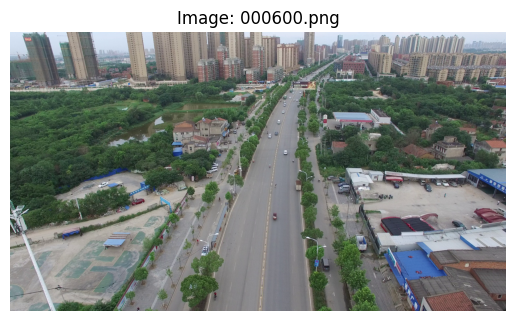

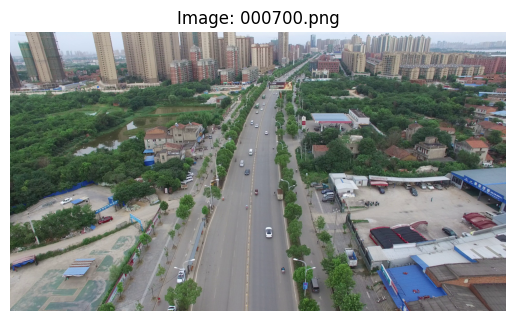

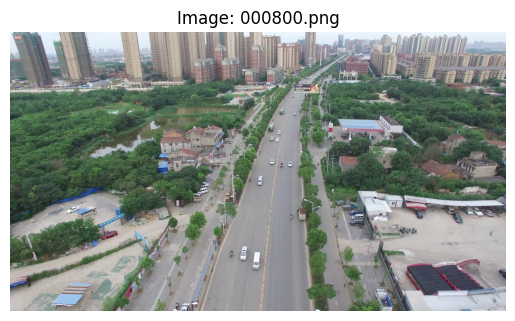

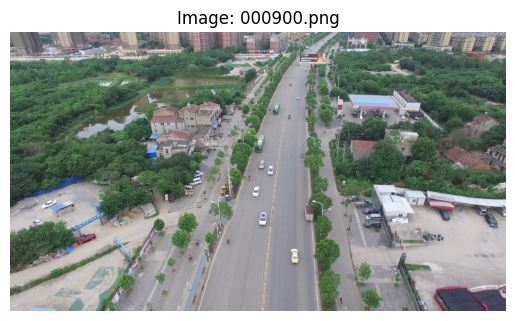

In [4]:
for i in test_indices[:1]:
    for j in range(10):
        display_image_and_label(test_dir, f'seq{i}', f'000{j}00.png', test=True)

# 3.Method

I implemented a custom PyTorch dataset preparation pipeline for the UAVidDataset. The process involves defining the class in PyTorch (UAVidDataset), data preprocessing by using transformations and visualizing one example of the data to make sure that everything is working appropriately.

### Procedure for Data Loading

The dataset uses the stored pathways of the train and validation samples to extract a matching image and label pair for every sample. The Python Imaging Library (PIL) is used to load the pictures and labels into memory. Then, modifications are implemented:

1. *Image Transformations*: Using the transforms, images are transformed into PyTorch tensors and scaled to a fixed resolution of 128×128 pixels.

2. *Label Transformations*: To preserve distinct class boundaries, labels are scaled to the same resolution using nearest-neighbor interpolation (Image.NEAREST).

To facilitate the model training, the label images are converted from RGB to numerical class indices. Basically, each pixel's color (corresponding to a class) is transformed into a class index value. The meaning of each color is the following:

- Red - building
- Muted purple - road
- Bright magenta - static car
- Green - tree
- Yellow - low vegetation
- Dark olive green - human
- Dark purple - moving car
- Black - background clutter

### DataLoader for Batch Processing

To facilitate effective batch processing, the dataset is contained within PyTorch's DataLoader class. Two distinct loaders are made:
1. A training loader that creates shuffled batches of labels and images for training (train_loader).
2. A validation loader that offers successive batches for assessment (validation_loader).
   
Each batch is made of 8 samples.

### Architecture of the U-Net Model
<div>
    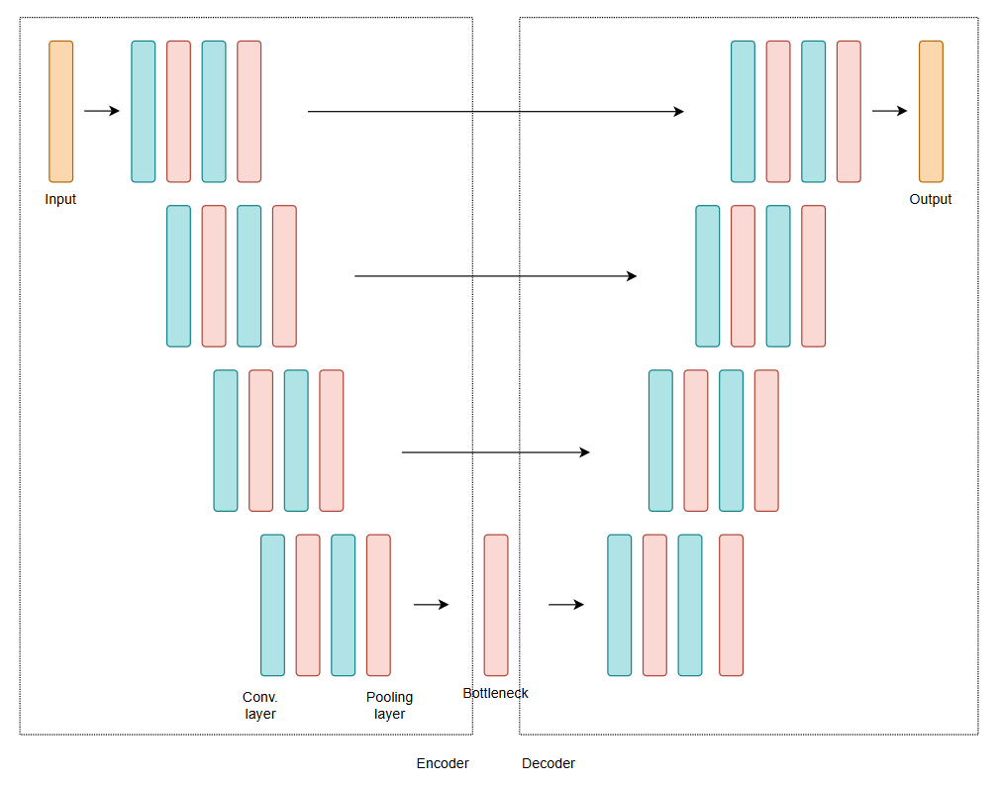
</div>

**Encoder**
The encoder consists of four convolutional blocks, each followed by a downsampling operation (max pooling). Each block extracts increasingly complex features from the input image:
- Block 1: Takes the input image (e.g., RGB with 3 channels) and outputs 32 feature maps.
- Block 2: Processes the features from Block 1 and outputs 64 feature maps.
- Block 3: Further processes the features to produce 128 feature maps.
- Block 4: Outputs 256 feature maps.
Each block (conv_block) consists of two 3×3 convolutional layers with ReLU activation, ensuring the model is able to learn valuable feature representations.

**Bottleneck**
The bottleneck is a bridge between the encoder and decoder. It processes the deepest features (256 feature maps) into 512 feature maps at the smallest spatial resolution. Similar to the encoder blocks, it contains two 3×3 convolutional layers with ReLU activation.

**Decoder**
The decoder reconstructs a high-resolution output image label from the abstract features produced by the bottleneck. The decoder consists of four blocks:
- Block 4: Upsamples the bottleneck output (512 channels) to match the resolution of the fourth encoder block (256 channels) and refines the concatenated features to produce 256 channels.
- Block 3: Similar operations, reducing features to 128 channels.
- Block 2: Refines the features to 64 channels.
- Block 1: Final block, producing 32 channels.

The output layer is a simple 1×1 convolution layer, which reduces the 32 feature maps resulted from the last encoder to the desired number of classes (8). This layer effectively assigns a class label to each pixel of the predicted label image.

**Skip Connections**
A key feature of U-Net is the skip connections, which directly link corresponding encoder and decoder blocks. These connections allow the model to combine high-level features from the encoder with spatially detailed features, improving segmentation accuracy, especially for small or fine structures.

Get the size of an image:

In [5]:
for i in train_indices[:1]:
    for j in range(1):
        img_path = os.path.join(train_dir, f'seq{i}', 'Images', f'000{j}00.png')
        img = Image.open(img_path)
        print(img.size)

(3840, 2160)


Get the percentage of each class in the train set:

In [23]:
class_counts = np.zeros(8)  

total_pixels = 0

for images, labels in train_loader:
    flattened_labels = labels.flatten()

    counts = np.bincount(flattened_labels.cpu().numpy(), minlength=8)  
    class_counts += counts  

    total_pixels += flattened_labels.size(0)  

class_percentages = (class_counts / total_pixels) * 100

for i, percentage in enumerate(class_percentages):
    print(f"Class {i} ({class_names[i]}): {percentage:.2f}%")

Class 0 (Building): 28.65%
Class 1 (Road): 12.70%
Class 2 (Static car): 1.17%
Class 3 (Tree): 25.20%
Class 4 (Low vegetation): 13.12%
Class 5 (Human): 0.11%
Class 6 (Moving car): 0.94%
Class 7 (Background): 18.10%


Now we define a function that transforms the labeled images to class label map. Basically, each pixel's color (corresponding to a class) is transformed into a class index value.

In [6]:
def color_to_class(label_image):
    color_map = {
        (128, 0, 0): 0,       # Building
        (128, 64, 128): 1,    # Road
        (192, 0, 192): 2,     # Static car
        (0, 128, 0): 3,       # Tree
        (128, 128, 0): 4,     # Low vegetation
        (64, 64, 0): 5,       # Human
        (64, 0, 128): 6,      # Moving car
        (0, 0, 0): 7,         # Background clutter
    }

    label_array = np.array(label_image)

    label_class = np.zeros((label_array.shape[0], label_array.shape[1]), dtype=np.int64)

    color_keys = np.array(list(color_map.keys()))
    color_values = np.array(list(color_map.values()))

    reshaped_image = label_array.reshape(-1, 3)  # Flatten the spatial dimensions
    indices = np.argwhere(np.all(reshaped_image[:, None, :] == color_keys[None, :, :], axis=2))[:, 1]
    label_class = color_values[indices].reshape(label_array.shape[:2])

    return torch.tensor(label_class, dtype=torch.long).unsqueeze(0)  

Build the data loaders. We resize the images to (128, 128) in order to make the training faster.

Image batch size: torch.Size([8, 3, 128, 128])
Label batch size: torch.Size([8, 1, 128, 128])


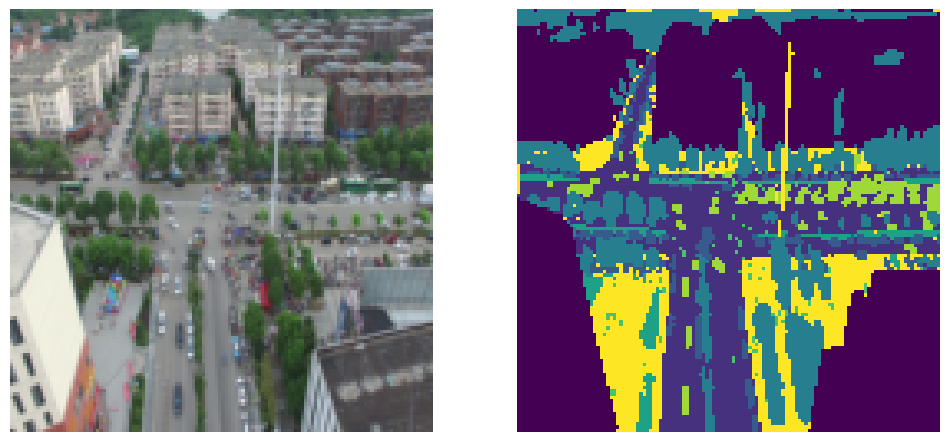

In [7]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Custom dataset class for UAVid
class UAVidDataset(Dataset):
    def __init__(self, root_dir, transform=None, label_transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.label_transform = label_transform
        self.image_paths = []
        self.label_paths = []

        for seq in os.listdir(root_dir):
            seq_img_dir = os.path.join(root_dir, seq, 'Images')
            seq_label_dir = os.path.join(root_dir, seq, 'Labels')

            for img_name in os.listdir(seq_img_dir):
                self.image_paths.append(os.path.join(seq_img_dir, img_name))
                self.label_paths.append(os.path.join(seq_label_dir, img_name))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label_path = self.label_paths[idx]
        
        image = Image.open(img_path)
        label_image = Image.open(label_path)

        if self.transform:
            image = self.transform(image)

        label = color_to_class(label_image)  

        if self.label_transform:
            label = self.label_transform(label)

        return image, label


image_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

label_transform = transforms.Compose([
    transforms.Resize((128, 128), interpolation=Image.NEAREST),
])

train_dataset = UAVidDataset(train_dir, transform=image_transform, label_transform=label_transform)
validation_dataset = UAVidDataset(validation_dir, transform=image_transform, label_transform=label_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True)
validation_loader = DataLoader(validation_dataset, batch_size=8, shuffle=False, pin_memory=True)

# Displaying a batch of images and labels
for images, labels in train_loader:
    print(f"Image batch size: {images.size()}")
    print(f"Label batch size: {labels.size()}")

    image_to_display = images[0].permute(1, 2, 0).numpy()
    label_to_display = labels[0].permute(1, 2, 0).numpy()

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(image_to_display)
    axes[0].axis('off')  

    axes[1].imshow(label_to_display)
    axes[1].axis('off')  
    plt.show()
    break  

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        # Encoder
        self.enc1 = self.conv_block(in_channels, 32)
        self.enc2 = self.conv_block(32, 64)
        self.enc3 = self.conv_block(64, 128)
        self.enc4 = self.conv_block(128, 256)

        # Bottleneck
        self.bottleneck = self.conv_block(256, 512)

        # Decoder
        self.dec4 = self.upconv_block(512 + 256, 256)   # Bottleneck + enc4
        self.dec3 = self.upconv_block(256 + 128, 128)   # dec4 + enc3
        self.dec2 = self.upconv_block(128 + 64, 64)     # dec3 + enc2
        self.dec1 = self.upconv_block(64 + 32, 32)      # dec2 + enc1

        # Final convolution
        self.final_conv = nn.Conv2d(32, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, 2))
        enc3 = self.enc3(F.max_pool2d(enc2, 2))
        enc4 = self.enc4(F.max_pool2d(enc3, 2))

        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc4, 2))

        # Decoder
        dec4 = self.dec4(torch.cat([F.interpolate(bottleneck, enc4.size()[2:], mode='bilinear', align_corners=False), enc4], dim=1))
        dec3 = self.dec3(torch.cat([F.interpolate(dec4, enc3.size()[2:], mode='bilinear', align_corners=False), enc3], dim=1))
        dec2 = self.dec2(torch.cat([F.interpolate(dec3, enc2.size()[2:], mode='bilinear', align_corners=False), enc2], dim=1))
        dec1 = self.dec1(torch.cat([F.interpolate(dec2, enc1.size()[2:], mode='bilinear', align_corners=False), enc1], dim=1))

        # Output
        return self.final_conv(dec1)

model = UNet(in_channels=3, out_channels=8)
print(model)

UNet(
  (enc1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc4): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (bottleneck): Sequential(
    (0): Conv2d(256, 512, kernel

Now, we have to define the IoU loss, which is:

1. **Intersection**: 
   $$
   \text{Intersection} = \sum (\text{predictions} \cdot \text{labels\_one\_hot})
   $$

2. **Union**:
   $$
   \text{Union} = \sum (\text{predictions} + \text{labels\_one\_hot}) - \text{Intersection}
   $$

3. **IoU**:
   $$
   \text{IoU} = \frac{\text{Intersection} + \epsilon}{\text{Union} + \epsilon}
   $$

4. **IoU Loss**:
   $$
   \text{IoU Loss} = 1 - \text{IoU}
   $$

In [9]:
def iou_loss(predictions, labels, eps=1e-6):
    num_classes = predictions.shape[1]

    labels_one_hot = F.one_hot(labels, num_classes=num_classes).permute(0, 3, 1, 2).float()  

    intersection = (predictions * labels_one_hot).sum(dim=(2, 3))  
    union = (predictions + labels_one_hot).sum(dim=(2, 3)) - intersection  

    iou = (intersection + eps) / (union + eps)

    return 1 - iou.mean()

# 4. Experiments

I chose to train an initial model with the following hyper-parameters:

- number of epochs: 100
- learning rate: 0.0001
- optimizer: Adam
- loss: IoU
  
This model resulted in vague results, the predicted images looking like approximations of the gorund truth. The IoU loss was 0.7202.

Then, I changed the learning rate and increased it to 0.0003. The results were visually closer to the ground truth.

After that, as the validation error did not seem to be close to converging, I added 10 more epochs for the model to train.

Each experiment's result can be seen after its corresponding cell of code.

Train the model for 100 epochs, with an initial learning rate of 0.0001 and Adam optimizer (tried 0.001 before, but it results in overfitting):

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet(in_channels=3, out_channels=8).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001)
epochs = 100

scaler = torch.amp.GradScaler()

for epoch in range(epochs):
    model.train()
    running_iou_loss = 0.0  # For training loss

    # Training loop
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.squeeze(1).long()

        optimizer.zero_grad()

        with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
            outputs = model(images)
            predictions = torch.softmax(outputs, dim=1)

            iou_loss_value = iou_loss(predictions, labels)

        scaler.scale(iou_loss_value).backward()
        scaler.step(optimizer)
        scaler.update()

        running_iou_loss += iou_loss_value.item()

    avg_iou_loss = running_iou_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Training IoU Loss: {avg_iou_loss:.4f}")
    
    # Validation loop
    model.eval()  
    running_val_iou_loss = 0.0  # For validation loss

    with torch.no_grad():  
        for images, labels in validation_loader:  
            images, labels = images.to(device), labels.to(device)
            labels = labels.squeeze(1).long()

            with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
                outputs = model(images)
                predictions = torch.softmax(outputs, dim=1)

                val_iou_loss_value = iou_loss(predictions, labels)

            running_val_iou_loss += val_iou_loss_value.item()

    avg_val_iou_loss = running_val_iou_loss / len(validation_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Validation IoU Loss: {avg_val_iou_loss:.4f}")

C:\Users\MCA5CLJ\.conda\envs\tf_remote\lib\site-packages\torch\amp\grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
C:\Users\MCA5CLJ\.conda\envs\tf_remote\lib\site-packages\torch\amp\autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


Epoch [1/100], Training IoU Loss: 0.9507
Epoch [1/100], Validation IoU Loss: 0.9500
Epoch [2/100], Training IoU Loss: 0.9399
Epoch [2/100], Validation IoU Loss: 0.9359
Epoch [3/100], Training IoU Loss: 0.9291
Epoch [3/100], Validation IoU Loss: 0.9264
Epoch [4/100], Training IoU Loss: 0.9207
Epoch [4/100], Validation IoU Loss: 0.9225
Epoch [5/100], Training IoU Loss: 0.9166
Epoch [5/100], Validation IoU Loss: 0.9138
Epoch [6/100], Training IoU Loss: 0.9029
Epoch [6/100], Validation IoU Loss: 0.8938
Epoch [7/100], Training IoU Loss: 0.8951
Epoch [7/100], Validation IoU Loss: 0.8778
Epoch [8/100], Training IoU Loss: 0.8850
Epoch [8/100], Validation IoU Loss: 0.8743
Epoch [9/100], Training IoU Loss: 0.8745
Epoch [9/100], Validation IoU Loss: 0.8773
Epoch [10/100], Training IoU Loss: 0.8730
Epoch [10/100], Validation IoU Loss: 0.8793
Epoch [11/100], Training IoU Loss: 0.8707
Epoch [11/100], Validation IoU Loss: 0.8757
Epoch [12/100], Training IoU Loss: 0.8654
Epoch [12/100], Validation IoU

Function for converting the model predictions to actual images of the segmented data:

In [11]:
def class_to_color(prediction):
    color_map = {
        0: (128, 0, 0),       # Building
        1: (128, 64, 128),    # Road
        2: (192, 0, 192),     # Static car
        3: (0, 128, 0),       # Tree
        4: (128, 128, 0),     # Low vegetation
        5: (64, 64, 0),       # Human
        6: (64, 0, 128),      # Moving car
        7: (0, 0, 0),         # Background clutter
    }

    height, width = prediction.shape
    color_image = np.zeros((height, width, 3), dtype=np.uint8)

    for class_index, color in color_map.items():
        color_image[prediction == class_index] = color

    return color_image

Compare the model predictions to the ground truth for the first 5 samples of the validation data:

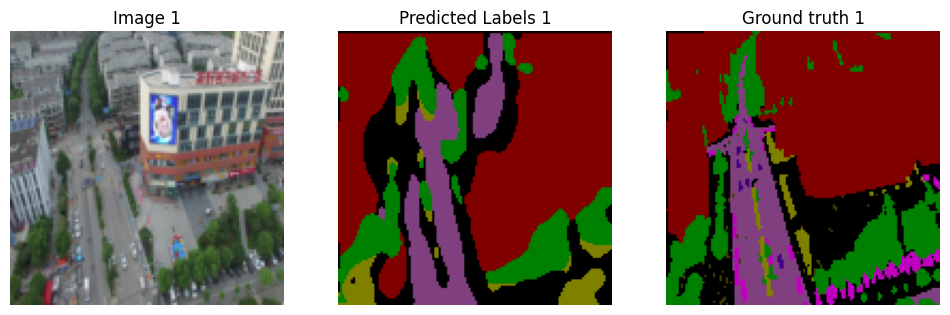

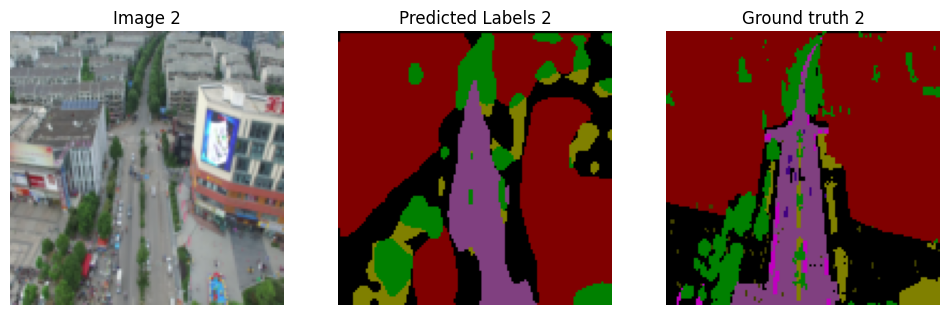

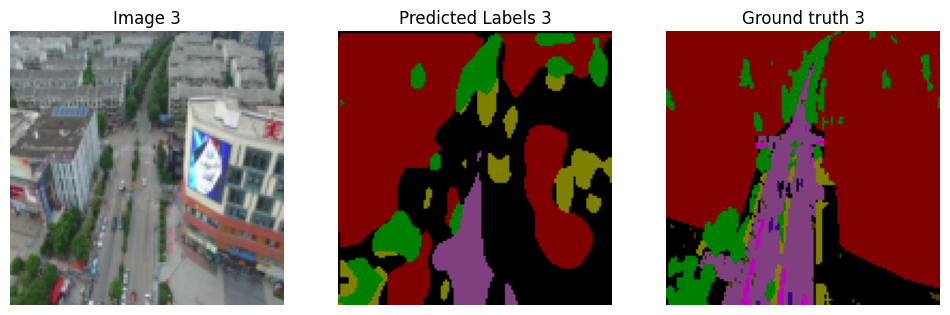

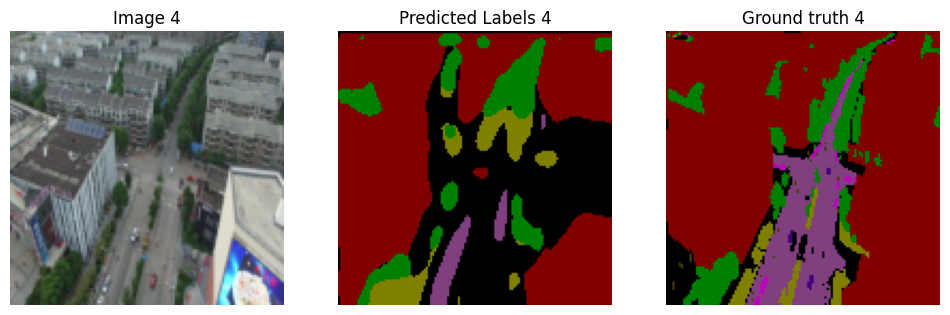

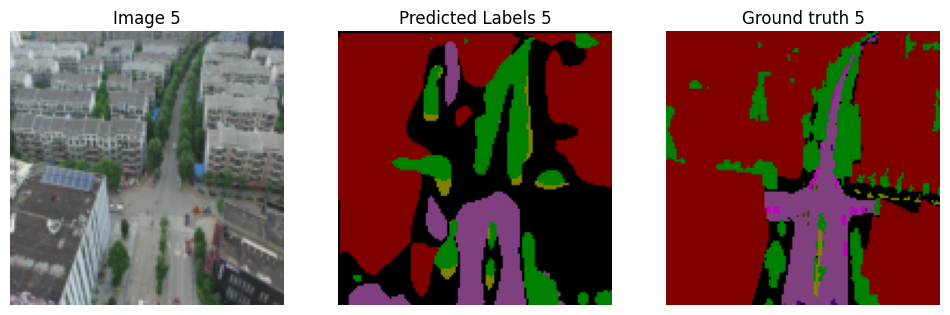

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

for images, labels in validation_loader:
    images, labels = images.to(device), labels.to(device)

    out = model(images)

    predicted_labels = torch.argmax(out, dim=1)  

    for i in range(min(5, images.size(0))): 
        image_to_display = images[i].permute(1, 2, 0).cpu().numpy()  
        ground_truth = labels[i].squeeze().cpu().numpy()
        predicted_label = predicted_labels[i].detach().cpu().numpy()  

        label_to_display = class_to_color(predicted_label)
        ground_truth_to_display = class_to_color(ground_truth)

        fig, axes = plt.subplots(1, 3, figsize=(12, 6))
        axes[0].imshow(image_to_display)
        axes[0].set_title(f"Image {i + 1}")
        axes[0].axis('off')  

        axes[1].imshow(label_to_display)
        axes[1].set_title(f"Predicted Labels {i + 1}")
        axes[1].axis('off')  

        axes[2].imshow(ground_truth_to_display)
        axes[2].set_title(f"Ground truth {i + 1}")
        axes[2].axis('off')  

        plt.show()
    break  

Calculate the IoU loss over the validation set:

In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

model.eval()  
validation_iou_loss = 0.0  
num_batches = 0  

with torch.no_grad(): 
    for images, labels in validation_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.squeeze().long()

        out = model(images)
        predictions = torch.softmax(out, dim=1)  

        batch_iou_loss = iou_loss(predictions, labels)
        validation_iou_loss += batch_iou_loss.item()  
        num_batches += 1  

average_validation_iou_loss = validation_iou_loss / num_batches
print(f"Average IoU Loss on Validation Set: {average_validation_iou_loss:.4f}")

Average IoU Loss on Validation Set: 0.7202


Try a learning rate of 0.0003:

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_2 = UNet(in_channels=3, out_channels=8).to(device)
optimizer_2 = optim.Adam(model_2.parameters(), lr=0.0003)
epochs = 100

scaler = torch.amp.GradScaler()

for epoch in range(epochs):
    model_2.train()
    running_iou_loss = 0.0  # For training loss

    # Training loop
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.squeeze(1).long()

        optimizer_2.zero_grad()

        with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
            outputs = model_2(images)
            predictions = torch.softmax(outputs, dim=1)

            iou_loss_value = iou_loss(predictions, labels)

        scaler.scale(iou_loss_value).backward()
        scaler.step(optimizer_2)
        scaler.update()

        running_iou_loss += iou_loss_value.item()

    avg_iou_loss = running_iou_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Training IoU Loss: {avg_iou_loss:.4f}")
    
    # Validation loop
    model_2.eval()  
    running_val_iou_loss = 0.0  # For validation loss

    with torch.no_grad():  
        for images, labels in validation_loader:  
            images, labels = images.to(device), labels.to(device)
            labels = labels.squeeze(1).long()

            with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
                outputs = model_2(images)
                predictions = torch.softmax(outputs, dim=1)

                val_iou_loss_value = iou_loss(predictions, labels)

            running_val_iou_loss += val_iou_loss_value.item()

    avg_val_iou_loss = running_val_iou_loss / len(validation_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Validation IoU Loss: {avg_val_iou_loss:.4f}")

Epoch [1/100], Training IoU Loss: 0.9470
Epoch [1/100], Validation IoU Loss: 0.9309
Epoch [2/100], Training IoU Loss: 0.9262
Epoch [2/100], Validation IoU Loss: 0.9248
Epoch [3/100], Training IoU Loss: 0.9129
Epoch [3/100], Validation IoU Loss: 0.9047
Epoch [4/100], Training IoU Loss: 0.9112
Epoch [4/100], Validation IoU Loss: 0.9010
Epoch [5/100], Training IoU Loss: 0.8998
Epoch [5/100], Validation IoU Loss: 0.8983
Epoch [6/100], Training IoU Loss: 0.8956
Epoch [6/100], Validation IoU Loss: 0.8857
Epoch [7/100], Training IoU Loss: 0.8898
Epoch [7/100], Validation IoU Loss: 0.8796
Epoch [8/100], Training IoU Loss: 0.8808
Epoch [8/100], Validation IoU Loss: 0.8730
Epoch [9/100], Training IoU Loss: 0.8641
Epoch [9/100], Validation IoU Loss: 0.8621
Epoch [10/100], Training IoU Loss: 0.8529
Epoch [10/100], Validation IoU Loss: 0.8600
Epoch [11/100], Training IoU Loss: 0.8429
Epoch [11/100], Validation IoU Loss: 0.8345
Epoch [12/100], Training IoU Loss: 0.8328
Epoch [12/100], Validation IoU

Compare the model predictions to the ground truth for the first 5 samples of the validation data:

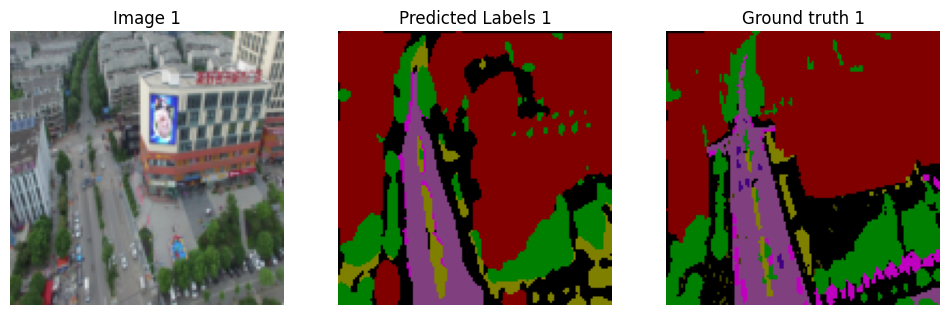

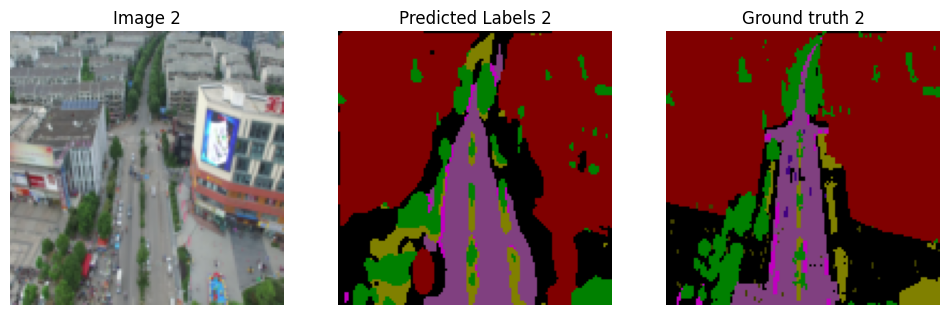

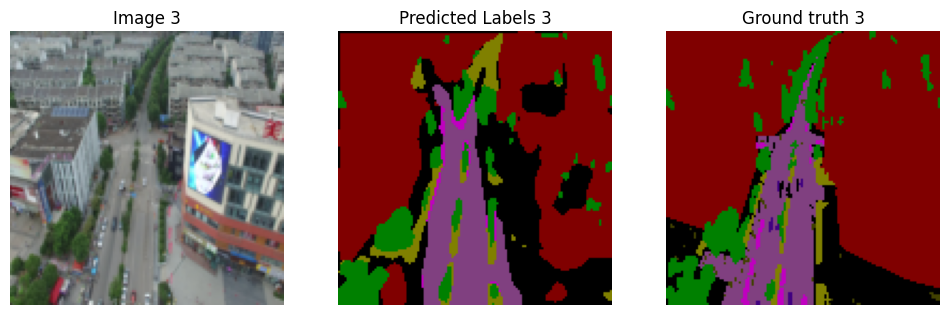

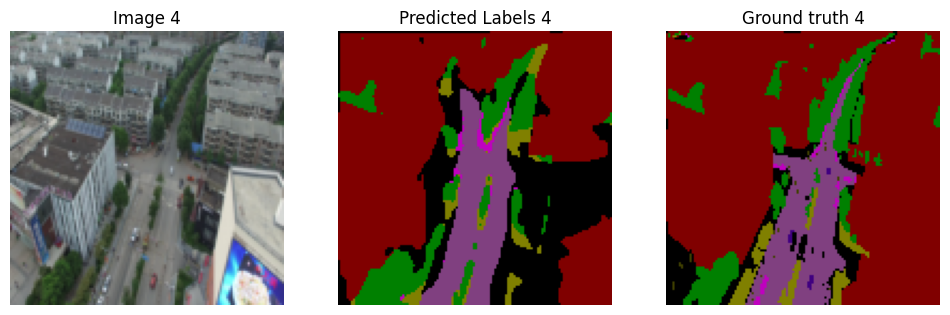

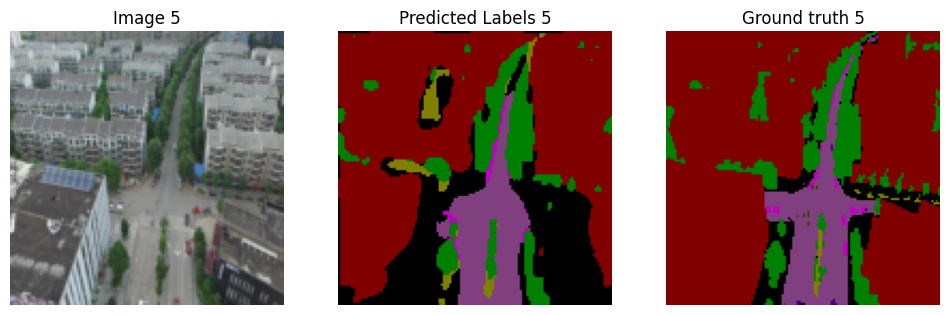

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_2 = model_2.to(device)

for images, labels in validation_loader:
    images, labels = images.to(device), labels.to(device)

    out_2 = model_2(images)

    predicted_labels_2 = torch.argmax(out_2, dim=1)  

    for i in range(min(5, images.size(0))): 
        image_to_display_2 = images[i].permute(1, 2, 0).cpu().numpy()  
        ground_truth_2 = labels[i].squeeze().cpu().numpy()
        predicted_label_2 = predicted_labels_2[i].detach().cpu().numpy()  

        label_to_display_2 = class_to_color(predicted_label_2)
        ground_truth_to_display_2 = class_to_color(ground_truth_2)

        fig, axes = plt.subplots(1, 3, figsize=(12, 6))
        axes[0].imshow(image_to_display_2)
        axes[0].set_title(f"Image {i + 1}")
        axes[0].axis('off')  

        axes[1].imshow(label_to_display_2)
        axes[1].set_title(f"Predicted Labels {i + 1}")
        axes[1].axis('off')  

        axes[2].imshow(ground_truth_to_display_2)
        axes[2].set_title(f"Ground truth {i + 1}")
        axes[2].axis('off')  

        plt.show()
        
    break  

Try to train the model a little more:

In [24]:
epochs_cont = 10

for epoch in range(epochs_cont):
    model_2.train()
    running_iou_loss = 0.0  # For training loss

    # Training loop
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.squeeze(1).long()

        optimizer_2.zero_grad()

        with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
            outputs = model_2(images)
            predictions = torch.softmax(outputs, dim=1)

            iou_loss_value = iou_loss(predictions, labels)

        scaler.scale(iou_loss_value).backward()
        scaler.step(optimizer_2)
        scaler.update()

        running_iou_loss += iou_loss_value.item()

    avg_iou_loss = running_iou_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Training IoU Loss: {avg_iou_loss:.4f}")
    
    # Validation loop
    model_2.eval()  
    running_val_iou_loss = 0.0  # For validation loss

    with torch.no_grad():  
        for images, labels in validation_loader:  
            images, labels = images.to(device), labels.to(device)
            labels = labels.squeeze(1).long()

            with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
                outputs = model_2(images)
                predictions = torch.softmax(outputs, dim=1)

                val_iou_loss_value = iou_loss(predictions, labels)

            running_val_iou_loss += val_iou_loss_value.item()

    avg_val_iou_loss = running_val_iou_loss / len(validation_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Validation IoU Loss: {avg_val_iou_loss:.4f}")

C:\Users\MCA5CLJ\.conda\envs\tf_remote\lib\site-packages\torch\amp\autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


Epoch [1/100], Training IoU Loss: 0.5003
Epoch [1/100], Validation IoU Loss: 0.6745
Epoch [2/100], Training IoU Loss: 0.4996
Epoch [2/100], Validation IoU Loss: 0.6797
Epoch [3/100], Training IoU Loss: 0.4983
Epoch [3/100], Validation IoU Loss: 0.6744
Epoch [4/100], Training IoU Loss: 0.4947
Epoch [4/100], Validation IoU Loss: 0.6763
Epoch [5/100], Training IoU Loss: 0.4962
Epoch [5/100], Validation IoU Loss: 0.6772
Epoch [6/100], Training IoU Loss: 0.4995
Epoch [6/100], Validation IoU Loss: 0.6770
Epoch [7/100], Training IoU Loss: 0.4985
Epoch [7/100], Validation IoU Loss: 0.6739
Epoch [8/100], Training IoU Loss: 0.4964
Epoch [8/100], Validation IoU Loss: 0.6805
Epoch [9/100], Training IoU Loss: 0.4944
Epoch [9/100], Validation IoU Loss: 0.6779
Epoch [10/100], Training IoU Loss: 0.4940
Epoch [10/100], Validation IoU Loss: 0.6744


Based on the validation IoU loss, the model seems to have converged. Let's see its predicitons on validation data:

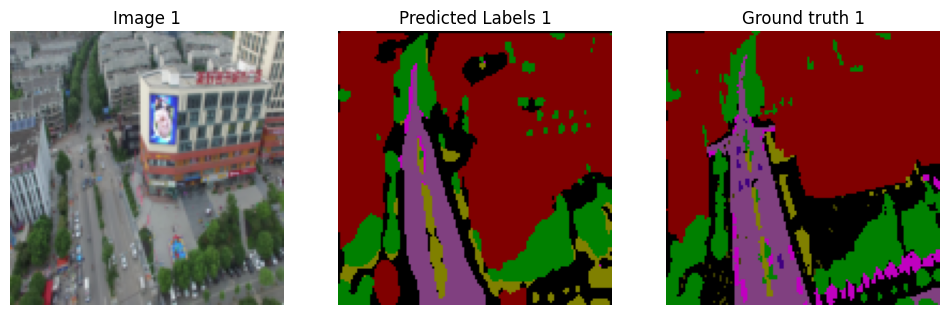

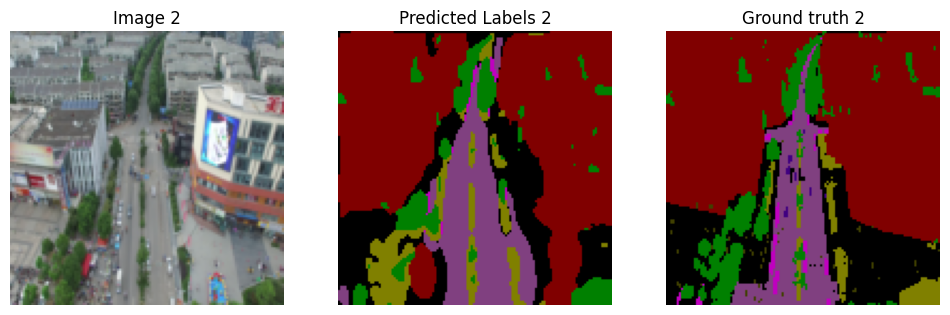

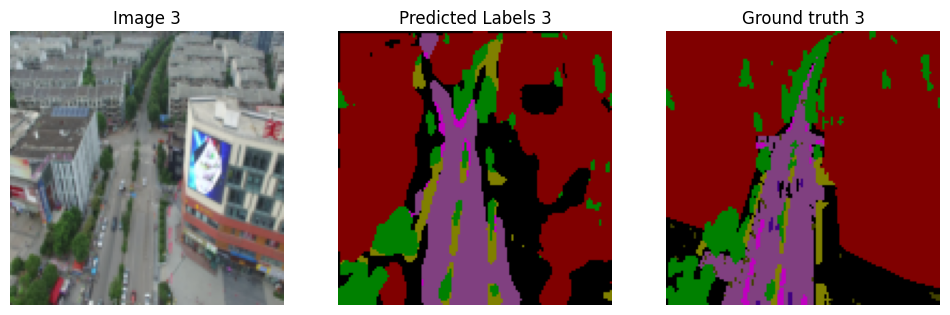

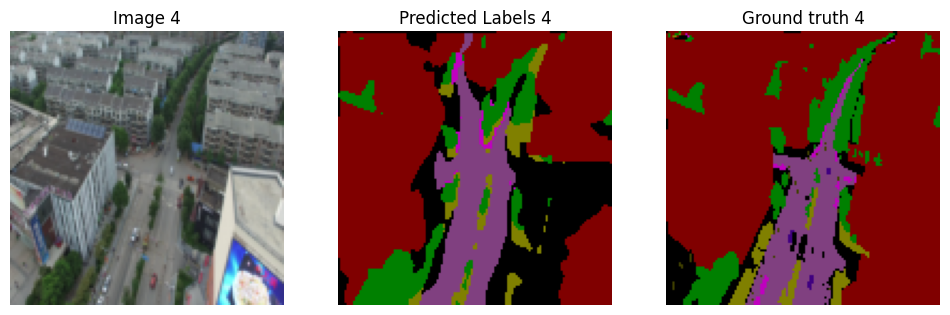

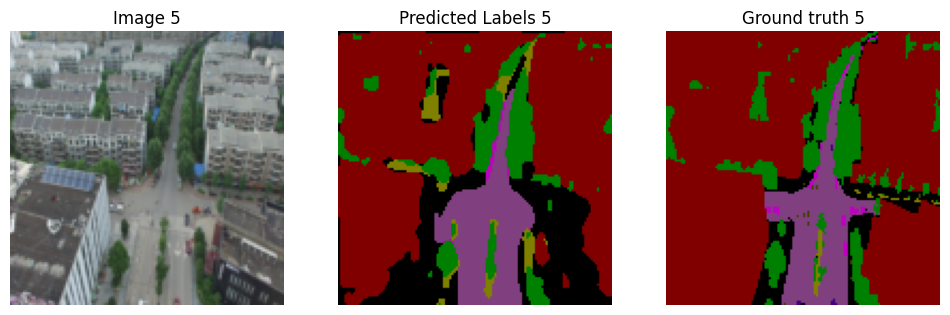

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_2 = model_2.to(device)

for images, labels in validation_loader:
    images, labels = images.to(device), labels.to(device)

    out_2 = model_2(images)

    predicted_labels_2 = torch.argmax(out_2, dim=1)  

    for i in range(min(5, images.size(0))): 
        image_to_display_2 = images[i].permute(1, 2, 0).cpu().numpy()  
        ground_truth_2 = labels[i].squeeze().cpu().numpy()
        predicted_label_2 = predicted_labels_2[i].detach().cpu().numpy()  

        label_to_display_2 = class_to_color(predicted_label_2)
        ground_truth_to_display_2 = class_to_color(ground_truth_2)

        fig, axes = plt.subplots(1, 3, figsize=(12, 6))
        axes[0].imshow(image_to_display_2)
        axes[0].set_title(f"Image {i + 1}")
        axes[0].axis('off')  

        axes[1].imshow(label_to_display_2)
        axes[1].set_title(f"Predicted Labels {i + 1}")
        axes[1].axis('off')  

        axes[2].imshow(ground_truth_to_display_2)
        axes[2].set_title(f"Ground truth {i + 1}")
        axes[2].axis('off')  

        plt.show()
        
    break  

### Confusion Matrix

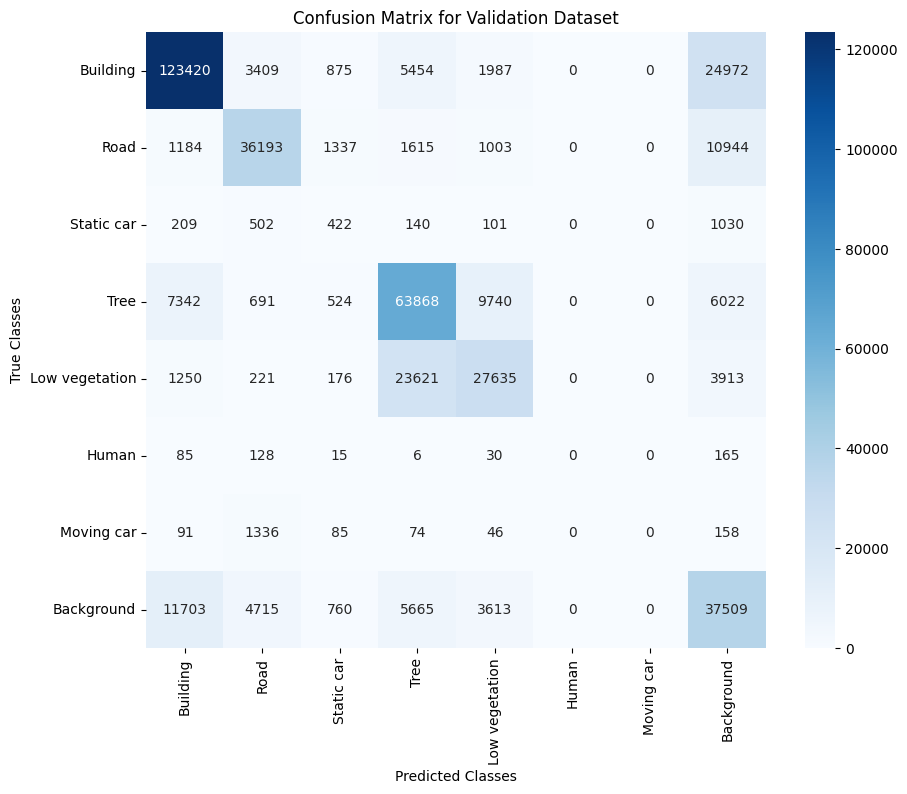

In [22]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

class_names = [
    'Building',      # 0
    'Road',          # 1
    'Static car',    # 2
    'Tree',          # 3
    'Low vegetation',# 4
    'Human',         # 5
    'Moving car',    # 6
    'Background'     # 7
]

all_predictions = []
all_ground_truths = []

for images, labels in validation_loader:
    images, labels = images.to(device), labels.to(device)

    out_2 = model_2(images)
    predicted_labels_2 = torch.argmax(out_2, dim=1)  # Shape: [batch_size, H, W]

    all_predictions.append(predicted_labels_2.cpu().numpy().flatten())
    all_ground_truths.append(labels.cpu().numpy().flatten())

all_predictions = np.concatenate(all_predictions)
all_ground_truths = np.concatenate(all_ground_truths)

conf_matrix = confusion_matrix(all_ground_truths, all_predictions, labels=list(range(8)))

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Classes')
plt.ylabel('True Classes')
plt.title('Confusion Matrix for Validation Dataset')
plt.show()

See predictions on test data:

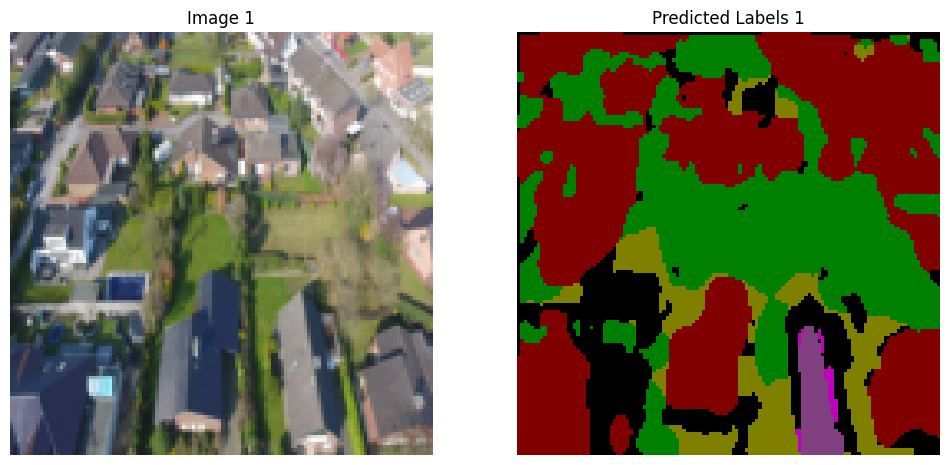

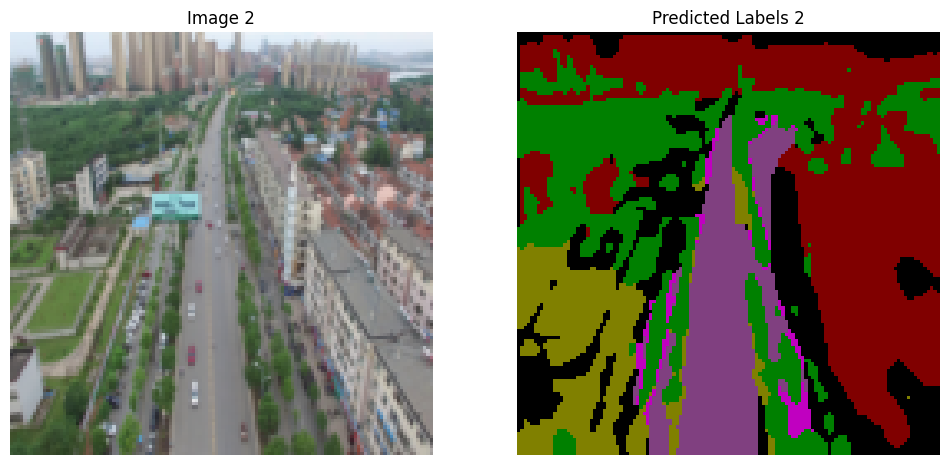

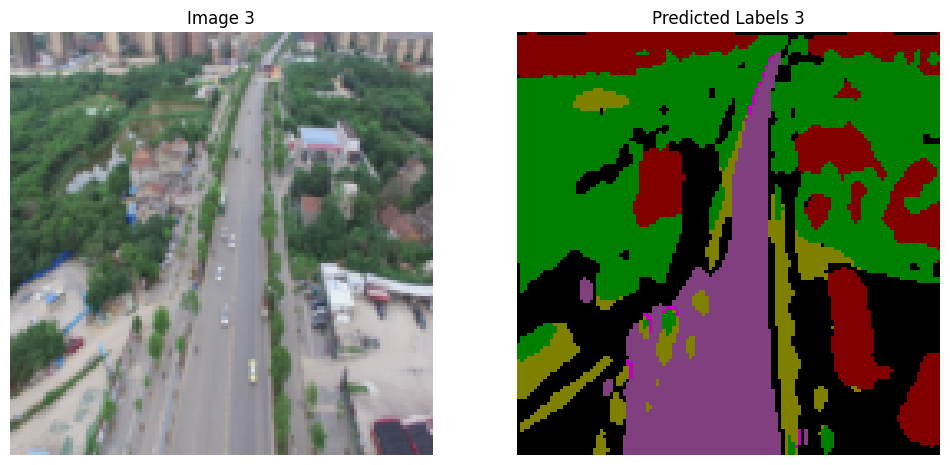

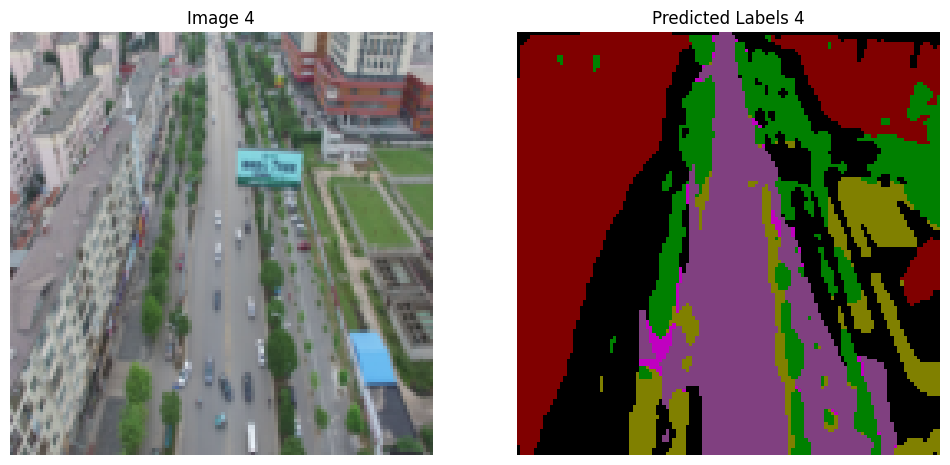

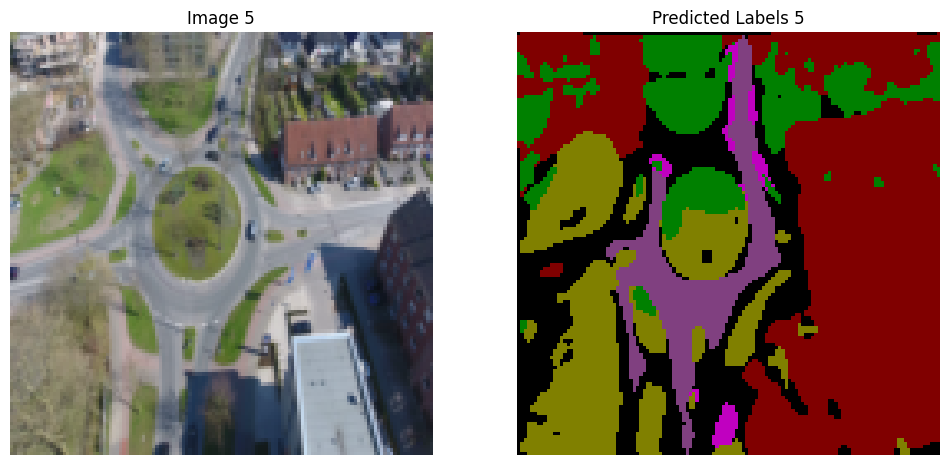

In [27]:
class UAVidTestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.label_paths = []

        for seq in os.listdir(root_dir):
            seq_img_dir = os.path.join(root_dir, seq, 'Images')

            for img_name in os.listdir(seq_img_dir):
                self.image_paths.append(os.path.join(seq_img_dir, img_name))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        
        image = Image.open(img_path)

        if self.transform:
            image = self.transform(image)

        return image


image_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

test_dataset = UAVidTestDataset(test_dir, transform=image_transform)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=True, pin_memory=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_2 = model_2.to(device)

for images in test_loader:
    images = images.to(device)

    out_2 = model_2(images)

    predicted_labels_3 = torch.argmax(out_2, dim=1)  

    for i in range(min(5, images.size(0))): 
        image_to_display_3 = images[i].permute(1, 2, 0).cpu().numpy()  
        predicted_label_3 = predicted_labels_3[i].detach().cpu().numpy()  

        label_to_display_3 = class_to_color(predicted_label_3)

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image_to_display_3)
        axes[0].set_title(f"Image {i + 1}")
        axes[0].axis('off')  

        axes[1].imshow(label_to_display_3)
        axes[1].set_title(f"Predicted Labels {i + 1}")
        axes[1].axis('off')  

        plt.show()
        
    break  

# 5. Conclusions and Future Work

In this project, I explored the possibilities of using the U-Net architecture foar aerial images. To gain more comprehensive understanding of the model's results, I used IoU and confusion matrixes. This project provided me with a deeper understanding of how U-Net works and also helped me explore segmentation tasks in a more detailed manner.

In the future, more a more complex architecture could be explored, alongside using more data augmentation techniques and also different hyper-parameters, such as more training epochs (since the current processing power is very low for such a complex task). Also, other architectures and techniques could be explored, as well as experimenting with different datasets.